# 5G UE-VBS Selection ML Model
## Heuristic Algorithm for Identifying the Cluster Head and Sum Rate Calculation

- <strong>Environment setup:</strong> import libraries and load the dataset
* <strong>Two-stage Engine:</strong> pipeling the different stages of the engine
    * Data simulation
    * Clustering
    * Classification
* <strong>Heuristic Algorithm: </strong> to determine the cluster head which is the UE-VBS for that cluster
* <strong>Calculation of Sum Rate: </strong> to evaluate the performance of the heuristic algorithm as opposed to random selection of a UE-VBS from the eligible list (post-classification)

## Environmental Setup

In [1]:
import math
import random

import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans

from sklearn.metrics import silhouette_score

## Pipeling the Model
### Generating the UE co-ordinates

In [2]:
def get_coordinates(number_of_ue_devices = 100, max_range=100):
    # default number of UE devices = 100
    coordinates = []

    for i in range(number_of_ue_devices):
        # Return the next random floating point number in the range [0.0, 1.0) - random.random()
        # By multiplying with 1000, the effective range shifts to [0, 1000) 
        coordinates.append([(random.random() * max_range), (random.random() * max_range)])
    return np.array(coordinates)

In [3]:
# initial coordinates at T1
number_of_ue_devices = 100
max_range = 1000
c = get_coordinates(number_of_ue_devices, max_range)

# Constant Parameters for propogation

dt = 20 #time interval
speed = [ random.randint(-10, 10) for _ in range(number_of_ue_devices) ]; # random speeds
angle =  [ random.randint(10, 350) for _ in range(number_of_ue_devices)] ; # random angles

# Base-Station Coordintes 
base_station_coordinates = [[500, 500]]

# At Time-0
x_1 = np.array([ i[0] for i in c ])
y_1 = np.array([ i[1] for i in c ])

# At Time-1
x_2 = [ x_1[i] + (speed[i] * dt) for i in range(number_of_ue_devices)]
y_2 = [ y_1[i] + (math.cos(angle[i]) * math.pi / 180) * dt for i in range(number_of_ue_devices)]

# At Time-2
x_3 = [ x_2[i] + (speed[i] * dt) for i in range(number_of_ue_devices)]
y_3 = [ y_2[i] + (math.cos(angle[i]) * math.pi / 180) * dt for i in range(number_of_ue_devices)]

### Identifying the ideal number of clusters based on the silhouette score

In [4]:
scores = []
for i in [2,3,4,5,6]:
    km = KMeans(n_clusters=i)
    y_predict = km.fit_predict(c)
    scores.append(silhouette_score(c, y_predict, metric='euclidean'))
#     print("Silhouette Score for ", silhouette_score(c, y_predict))
    
    
num_clusters = scores.index(max(scores)) + 2
print("Ideal number of clusters: ", num_clusters)

Ideal number of clusters:  4


### K-Means clustering

In [5]:
km = KMeans(n_clusters=num_clusters)
yhat = km.fit_predict(c) 

### UE Parameter calculations

In [6]:
# Battery information 
instantanous_battery_amount = np.array([ (random.random() * 400) + 500 for _ in range(number_of_ue_devices) ]) 
decay = np.array([ random.randrange(1, 15) + 5 for _ in range(number_of_ue_devices) ])
battery_discharge_rate = np.array(instantanous_battery_amount/decay)

_alpha = 0.5
_beta = 0.5
_lambda = 4

# Parameters used in the log-normal path loss model 

speed_of_light = 3e8 
frequency = 5e9
frequency_4g = 1.9e9
wavelength = speed_of_light / frequency
wavelength_4g= speed_of_light / frequency_4g

dref = 10;
tx_antenna_gain = 1 # db
rx_antenna_gain = 1 # db
tx_power = 0.25; # watt
path_loss_exponent = 4 # Line Of sight
PTxdBm = 10 * math.log10(tx_power*1000); # db <-> watt conversion
gaussian_random_variable = np.random.randn() * 0.1
standard_base_station_power = 43

sigma = 6; # Sigma from 6 to 12 - Principles of communication systems simulation with wireless application P.548
distance_msr = 60;

base_station_coordinates = [[500, 500]]

# to calculate data rate (noisy channel)
# data_rate = bandwidth * log2(1 + SNR) bits/sec
# bandwidth = 800 MHz -> https://blogs.keysight.com/blogs/inds.entry.html/2018/10/31/understanding_5gnew-iYIV.html

In [7]:
# cluster-wise seperation
clusters = np.unique(yhat)
df = pd.DataFrame(columns = ['x', 'y', 'cluster_number', 'distance_from_base_station', 'battery_discharge_rate'])
for cluster in clusters:
    # temp dataframe
    df2 = pd.DataFrame(columns = ['x', 'y', 'cluster_number', 'distance_from_base_station', 'battery_discharge_rate'])

    # indices corresponding each cluster
    row_ix = np.where(yhat == cluster)

    # cluster number
    df2['cluster_number'] = np.array([cluster] * len(row_ix[0]))

    # storing the coordinates
    df2['x'] = c[row_ix, 0].reshape(-1)
    df2['y'] = c[row_ix, 1].reshape(-1)

    # storing the distances
    df2['distance_from_base_station'] = cdist(c[row_ix], base_station_coordinates)

    # battery dischage rate
    df2['battery_discharge_rate'] = battery_discharge_rate[row_ix]

    df = df.append(df2, ignore_index = True)

In [8]:
# power from the base station 
df['M'] = wavelength / ( 4 * math.pi * df['distance_from_base_station'] ) 
df['pr0'] = standard_base_station_power + PTxdBm + tx_antenna_gain + rx_antenna_gain - np.array([ 20 * math.log10(i) for i in (1 / df['M']) ])
df['power'] = df['pr0'] - ( 10 * path_loss_exponent * math.log10(1/dref) ) + gaussian_random_variable

# master parameter 
df['master_parameter'] = _alpha * df['power'] + _beta * df['battery_discharge_rate']

In [9]:
# mobile configurations
possible_rams = [4, 6, 8, 12, 16]
df['memory'] = [ possible_rams[random.randrange(0, 4)] for _ in range(number_of_ue_devices) ] 

df['cpu_power'] = [ random.random() * 100 for _ in range(number_of_ue_devices) ]

### Cluster-based network parameter calculations

In [10]:
def signal_to_noise_ratio(ue_vbs, ue_device, cluster, power):
  # Sending index of eUE, its position, position of receiving UE and received power
    
    hnm = np.random.randn() + np.random.randn()*j # Rayleigh Fading Channel
    _lambda = 4
    dr = []
    gaussian_random = np.random.randn()*0.1 + 0
    nvar = -174+10 * math.log10(100e7)

    for i, row_i in cluster.iterrows():
#         if row_i.all() != ue_device.all() and row_i.all() != ue_vbs.all():
        rtm = ( (row_i['x'] - ue_device['x'])**2 + (row_i['y'] - ue_device['y'])**2 ) ** 0.5
        if rtm == 0:
            continue
        m = wavelength / ( 4 * math.pi * rtm )
        pr0 = row_i['power'] + tx_antenna_gain + rx_antenna_gain + ( 20 * math.log10(1/m) )
        prx = pr0 - ( 10 * path_loss_exponent * math.log10(1/dref) ) + gaussian_random
        rn = nvar + np.random.randn() + np.random.randn()*j * row_i['power'] * _lambda * (rtm**(-1*_lambda))
        dr.append(rn)
  
#     print(dr)
    inter = sum(dr)
    rnm = ( (ue_vbs['x'] - ue_device['x'])**2 + (ue_vbs['y'] - ue_device['y'])**2 ) ** 0.5
    if rnm == 0: return 0
    sign = hnm * power * _lambda * ( rnm ** (-1 * _lambda) )

    s = abs(sign/inter)
    return s

In [11]:
def spaceff(p1, p2, cluster):
    x = []
    for i, ue in cluster.iterrows():
        x.append(ue['power'])

    sx = sum(x)
    sx = (sx - p2) * 0.4292
    c2 = (p1 * 0.4292) / (p2 * 0.4292 + sx + 1)
    se = math.log2( 1 + c2 )

    return se

In [12]:
def max_mean(arr):
  # replaces sumsinr and sumse
    t = []
    for i in arr:
        t.append(i.mean())

    return max(t)

In [13]:
def quality_of_service(idx, cluster):
    x = []
    for i in cluster:
        x.append(i[idx])
    x = np.array(x)
    x = x/x.mean()

    return 1/(1+(x.var()/x.mean()))

In [14]:
def quality_of_experience(idx, cluster):
    x = []
    for i in cluster:
        x.append(i[idx])
    x = np.array(x)
    _sigma = np.std(x)

    return (2*_sigma)/(max(x) - min(x))

In [15]:
# Seperation of clusters

clusters_seperated = []
for cluster in clusters:
    clusters_seperated.append(df[df['cluster_number'] == cluster])

In [16]:
qos_final = []
snr_final = []
qoe_final = []
for cluster in clusters_seperated:
    ss = []
    sp = []

    for i, row_i in cluster.iterrows():
        for j, row_j in cluster.iterrows():
            if i != j:
                distance_from_eligible_ue = ( (row_i['x'] - row_j['x'])**2 + (row_i['y'] - row_j['y'])**2 )**0.5
                m = wavelength / ( 4 * math.pi * distance_from_eligible_ue )
                pr0 = row_i['power'] + tx_antenna_gain + rx_antenna_gain + ( 20 * math.log10(1/m) )
                prx = pr0 - ( 10 * path_loss_exponent * math.log10(1/dref) ) + gaussian_random_variable
                s = signal_to_noise_ratio(row_i, row_j, cluster, prx)
                ss.append(s)
                se = spaceff(prx, row_i['power'], cluster)
                sp.append(se)
            else:
                ss.append(0);
                sp.append(0)
            print(f"Cluster:{cluster} i:{i} j:{j}")

    ss1 = np.array(ss).reshape(len(cluster), len(cluster))
    sp1 = np.array(sp).reshape(len(cluster), len(cluster))

    qos = []
    for i in range(len(sp1)):
        qos.append(quality_of_service(i, sp1))

    qoe = []
    for i in range(len(sp1)):
        qoe.append(quality_of_experience(i, sp1))

    snr = []
    for i in ss1:
        snr.append(max_mean(i))

    snr_final.extend(snr)
    qos_final.extend(qos)
    qoe_final.extend(qoe)

df['qos'] = qos_final
df['qoe'] = qoe_final
df['snr'] = snr_final
df['data_rate'] = [ 100e7 * math.log2(1 + i) for i in df['snr'] ]

Cluster:             x           y cluster_number  distance_from_base_station  \
0    38.922854  412.182127              0                  469.365650   
1   437.255287  275.618736              0                  232.988949   
2   257.432966   34.524258              0                  524.887066   
3    38.756279   86.003778              0                  619.789191   
4   368.032774  379.274531              0                  178.857451   
5   306.656642  133.238459              0                  414.603041   
6   408.583740  276.531176              0                  241.444088   
7    87.925919  213.382632              0                  501.950759   
8   449.245989  102.389171              0                  400.837050   
9   173.688290  175.353957              0                  460.298148   
10  130.213415  190.633849              0                  482.130205   
11   63.384042  252.191993              0                  502.038149   
12  473.837233   33.301088              0  

22      12  21.059135   i:1 j:8
Cluster:             x           y cluster_number  distance_from_base_station  \
0    38.922854  412.182127              0                  469.365650   
1   437.255287  275.618736              0                  232.988949   
2   257.432966   34.524258              0                  524.887066   
3    38.756279   86.003778              0                  619.789191   
4   368.032774  379.274531              0                  178.857451   
5   306.656642  133.238459              0                  414.603041   
6   408.583740  276.531176              0                  241.444088   
7    87.925919  213.382632              0                  501.950759   
8   449.245989  102.389171              0                  400.837050   
9   173.688290  175.353957              0                  460.298148   
10  130.213415  190.633849              0                  482.130205   
11   63.384042  252.191993              0                  502.038149   
12  473.837

22      12  21.059135   i:2 j:15
Cluster:             x           y cluster_number  distance_from_base_station  \
0    38.922854  412.182127              0                  469.365650   
1   437.255287  275.618736              0                  232.988949   
2   257.432966   34.524258              0                  524.887066   
3    38.756279   86.003778              0                  619.789191   
4   368.032774  379.274531              0                  178.857451   
5   306.656642  133.238459              0                  414.603041   
6   408.583740  276.531176              0                  241.444088   
7    87.925919  213.382632              0                  501.950759   
8   449.245989  102.389171              0                  400.837050   
9   173.688290  175.353957              0                  460.298148   
10  130.213415  190.633849              0                  482.130205   
11   63.384042  252.191993              0                  502.038149   
12  473.83

22      12  21.059135   i:4 j:0
Cluster:             x           y cluster_number  distance_from_base_station  \
0    38.922854  412.182127              0                  469.365650   
1   437.255287  275.618736              0                  232.988949   
2   257.432966   34.524258              0                  524.887066   
3    38.756279   86.003778              0                  619.789191   
4   368.032774  379.274531              0                  178.857451   
5   306.656642  133.238459              0                  414.603041   
6   408.583740  276.531176              0                  241.444088   
7    87.925919  213.382632              0                  501.950759   
8   449.245989  102.389171              0                  400.837050   
9   173.688290  175.353957              0                  460.298148   
10  130.213415  190.633849              0                  482.130205   
11   63.384042  252.191993              0                  502.038149   
12  473.837

22      12  21.059135   i:5 j:8
Cluster:             x           y cluster_number  distance_from_base_station  \
0    38.922854  412.182127              0                  469.365650   
1   437.255287  275.618736              0                  232.988949   
2   257.432966   34.524258              0                  524.887066   
3    38.756279   86.003778              0                  619.789191   
4   368.032774  379.274531              0                  178.857451   
5   306.656642  133.238459              0                  414.603041   
6   408.583740  276.531176              0                  241.444088   
7    87.925919  213.382632              0                  501.950759   
8   449.245989  102.389171              0                  400.837050   
9   173.688290  175.353957              0                  460.298148   
10  130.213415  190.633849              0                  482.130205   
11   63.384042  252.191993              0                  502.038149   
12  473.837

22      12  21.059135   i:6 j:16
Cluster:             x           y cluster_number  distance_from_base_station  \
0    38.922854  412.182127              0                  469.365650   
1   437.255287  275.618736              0                  232.988949   
2   257.432966   34.524258              0                  524.887066   
3    38.756279   86.003778              0                  619.789191   
4   368.032774  379.274531              0                  178.857451   
5   306.656642  133.238459              0                  414.603041   
6   408.583740  276.531176              0                  241.444088   
7    87.925919  213.382632              0                  501.950759   
8   449.245989  102.389171              0                  400.837050   
9   173.688290  175.353957              0                  460.298148   
10  130.213415  190.633849              0                  482.130205   
11   63.384042  252.191993              0                  502.038149   
12  473.83

22      12  21.059135   i:8 j:1
Cluster:             x           y cluster_number  distance_from_base_station  \
0    38.922854  412.182127              0                  469.365650   
1   437.255287  275.618736              0                  232.988949   
2   257.432966   34.524258              0                  524.887066   
3    38.756279   86.003778              0                  619.789191   
4   368.032774  379.274531              0                  178.857451   
5   306.656642  133.238459              0                  414.603041   
6   408.583740  276.531176              0                  241.444088   
7    87.925919  213.382632              0                  501.950759   
8   449.245989  102.389171              0                  400.837050   
9   173.688290  175.353957              0                  460.298148   
10  130.213415  190.633849              0                  482.130205   
11   63.384042  252.191993              0                  502.038149   
12  473.837

22      12  21.059135   i:9 j:9
Cluster:             x           y cluster_number  distance_from_base_station  \
0    38.922854  412.182127              0                  469.365650   
1   437.255287  275.618736              0                  232.988949   
2   257.432966   34.524258              0                  524.887066   
3    38.756279   86.003778              0                  619.789191   
4   368.032774  379.274531              0                  178.857451   
5   306.656642  133.238459              0                  414.603041   
6   408.583740  276.531176              0                  241.444088   
7    87.925919  213.382632              0                  501.950759   
8   449.245989  102.389171              0                  400.837050   
9   173.688290  175.353957              0                  460.298148   
10  130.213415  190.633849              0                  482.130205   
11   63.384042  252.191993              0                  502.038149   
12  473.837

22      12  21.059135   i:10 j:16
Cluster:             x           y cluster_number  distance_from_base_station  \
0    38.922854  412.182127              0                  469.365650   
1   437.255287  275.618736              0                  232.988949   
2   257.432966   34.524258              0                  524.887066   
3    38.756279   86.003778              0                  619.789191   
4   368.032774  379.274531              0                  178.857451   
5   306.656642  133.238459              0                  414.603041   
6   408.583740  276.531176              0                  241.444088   
7    87.925919  213.382632              0                  501.950759   
8   449.245989  102.389171              0                  400.837050   
9   173.688290  175.353957              0                  460.298148   
10  130.213415  190.633849              0                  482.130205   
11   63.384042  252.191993              0                  502.038149   
12  473.8

22      12  21.059135   i:12 j:0
Cluster:             x           y cluster_number  distance_from_base_station  \
0    38.922854  412.182127              0                  469.365650   
1   437.255287  275.618736              0                  232.988949   
2   257.432966   34.524258              0                  524.887066   
3    38.756279   86.003778              0                  619.789191   
4   368.032774  379.274531              0                  178.857451   
5   306.656642  133.238459              0                  414.603041   
6   408.583740  276.531176              0                  241.444088   
7    87.925919  213.382632              0                  501.950759   
8   449.245989  102.389171              0                  400.837050   
9   173.688290  175.353957              0                  460.298148   
10  130.213415  190.633849              0                  482.130205   
11   63.384042  252.191993              0                  502.038149   
12  473.83

22      12  21.059135   i:13 j:6
Cluster:             x           y cluster_number  distance_from_base_station  \
0    38.922854  412.182127              0                  469.365650   
1   437.255287  275.618736              0                  232.988949   
2   257.432966   34.524258              0                  524.887066   
3    38.756279   86.003778              0                  619.789191   
4   368.032774  379.274531              0                  178.857451   
5   306.656642  133.238459              0                  414.603041   
6   408.583740  276.531176              0                  241.444088   
7    87.925919  213.382632              0                  501.950759   
8   449.245989  102.389171              0                  400.837050   
9   173.688290  175.353957              0                  460.298148   
10  130.213415  190.633849              0                  482.130205   
11   63.384042  252.191993              0                  502.038149   
12  473.83

22      12  21.059135   i:14 j:12
Cluster:             x           y cluster_number  distance_from_base_station  \
0    38.922854  412.182127              0                  469.365650   
1   437.255287  275.618736              0                  232.988949   
2   257.432966   34.524258              0                  524.887066   
3    38.756279   86.003778              0                  619.789191   
4   368.032774  379.274531              0                  178.857451   
5   306.656642  133.238459              0                  414.603041   
6   408.583740  276.531176              0                  241.444088   
7    87.925919  213.382632              0                  501.950759   
8   449.245989  102.389171              0                  400.837050   
9   173.688290  175.353957              0                  460.298148   
10  130.213415  190.633849              0                  482.130205   
11   63.384042  252.191993              0                  502.038149   
12  473.8

22      12  21.059135   i:15 j:19
Cluster:             x           y cluster_number  distance_from_base_station  \
0    38.922854  412.182127              0                  469.365650   
1   437.255287  275.618736              0                  232.988949   
2   257.432966   34.524258              0                  524.887066   
3    38.756279   86.003778              0                  619.789191   
4   368.032774  379.274531              0                  178.857451   
5   306.656642  133.238459              0                  414.603041   
6   408.583740  276.531176              0                  241.444088   
7    87.925919  213.382632              0                  501.950759   
8   449.245989  102.389171              0                  400.837050   
9   173.688290  175.353957              0                  460.298148   
10  130.213415  190.633849              0                  482.130205   
11   63.384042  252.191993              0                  502.038149   
12  473.8

22      12  21.059135   i:17 j:3
Cluster:             x           y cluster_number  distance_from_base_station  \
0    38.922854  412.182127              0                  469.365650   
1   437.255287  275.618736              0                  232.988949   
2   257.432966   34.524258              0                  524.887066   
3    38.756279   86.003778              0                  619.789191   
4   368.032774  379.274531              0                  178.857451   
5   306.656642  133.238459              0                  414.603041   
6   408.583740  276.531176              0                  241.444088   
7    87.925919  213.382632              0                  501.950759   
8   449.245989  102.389171              0                  400.837050   
9   173.688290  175.353957              0                  460.298148   
10  130.213415  190.633849              0                  482.130205   
11   63.384042  252.191993              0                  502.038149   
12  473.83

22      12  21.059135   i:18 j:13
Cluster:             x           y cluster_number  distance_from_base_station  \
0    38.922854  412.182127              0                  469.365650   
1   437.255287  275.618736              0                  232.988949   
2   257.432966   34.524258              0                  524.887066   
3    38.756279   86.003778              0                  619.789191   
4   368.032774  379.274531              0                  178.857451   
5   306.656642  133.238459              0                  414.603041   
6   408.583740  276.531176              0                  241.444088   
7    87.925919  213.382632              0                  501.950759   
8   449.245989  102.389171              0                  400.837050   
9   173.688290  175.353957              0                  460.298148   
10  130.213415  190.633849              0                  482.130205   
11   63.384042  252.191993              0                  502.038149   
12  473.8

22      12  21.059135   i:19 j:22
Cluster:             x           y cluster_number  distance_from_base_station  \
0    38.922854  412.182127              0                  469.365650   
1   437.255287  275.618736              0                  232.988949   
2   257.432966   34.524258              0                  524.887066   
3    38.756279   86.003778              0                  619.789191   
4   368.032774  379.274531              0                  178.857451   
5   306.656642  133.238459              0                  414.603041   
6   408.583740  276.531176              0                  241.444088   
7    87.925919  213.382632              0                  501.950759   
8   449.245989  102.389171              0                  400.837050   
9   173.688290  175.353957              0                  460.298148   
10  130.213415  190.633849              0                  482.130205   
11   63.384042  252.191993              0                  502.038149   
12  473.8

22      12  21.059135   i:21 j:7
Cluster:             x           y cluster_number  distance_from_base_station  \
0    38.922854  412.182127              0                  469.365650   
1   437.255287  275.618736              0                  232.988949   
2   257.432966   34.524258              0                  524.887066   
3    38.756279   86.003778              0                  619.789191   
4   368.032774  379.274531              0                  178.857451   
5   306.656642  133.238459              0                  414.603041   
6   408.583740  276.531176              0                  241.444088   
7    87.925919  213.382632              0                  501.950759   
8   449.245989  102.389171              0                  400.837050   
9   173.688290  175.353957              0                  460.298148   
10  130.213415  190.633849              0                  482.130205   
11   63.384042  252.191993              0                  502.038149   
12  473.83

22      12  21.059135   i:22 j:16
Cluster:             x           y cluster_number  distance_from_base_station  \
0    38.922854  412.182127              0                  469.365650   
1   437.255287  275.618736              0                  232.988949   
2   257.432966   34.524258              0                  524.887066   
3    38.756279   86.003778              0                  619.789191   
4   368.032774  379.274531              0                  178.857451   
5   306.656642  133.238459              0                  414.603041   
6   408.583740  276.531176              0                  241.444088   
7    87.925919  213.382632              0                  501.950759   
8   449.245989  102.389171              0                  400.837050   
9   173.688290  175.353957              0                  460.298148   
10  130.213415  190.633849              0                  482.130205   
11   63.384042  252.191993              0                  502.038149   
12  473.8

44       8  49.939840   i:24 j:23
Cluster:             x           y cluster_number  distance_from_base_station  \
23  542.646051  124.248226              1                  378.164093   
24  971.191265   39.633922              1                  658.754988   
25  670.214830   46.945060              1                  483.975069   
26  574.102783  281.265347              1                  230.946034   
27  655.181002  113.797577              1                  416.213233   
28  672.300902  185.892746              1                  358.261033   
29  558.025203  240.986222              1                  265.433723   
30  567.248260  384.695664              1                  133.481903   
31  794.147442  183.792695              1                  431.867778   
32  722.486363  159.051457              1                  407.119258   
33  759.691995  241.308628              1                  366.553076   
34  993.322980   99.272272              1                  635.570826   
35  756.8

44       8  49.939840   i:25 j:31
Cluster:             x           y cluster_number  distance_from_base_station  \
23  542.646051  124.248226              1                  378.164093   
24  971.191265   39.633922              1                  658.754988   
25  670.214830   46.945060              1                  483.975069   
26  574.102783  281.265347              1                  230.946034   
27  655.181002  113.797577              1                  416.213233   
28  672.300902  185.892746              1                  358.261033   
29  558.025203  240.986222              1                  265.433723   
30  567.248260  384.695664              1                  133.481903   
31  794.147442  183.792695              1                  431.867778   
32  722.486363  159.051457              1                  407.119258   
33  759.691995  241.308628              1                  366.553076   
34  993.322980   99.272272              1                  635.570826   
35  756.8

44       8  49.939840   i:26 j:41
Cluster:             x           y cluster_number  distance_from_base_station  \
23  542.646051  124.248226              1                  378.164093   
24  971.191265   39.633922              1                  658.754988   
25  670.214830   46.945060              1                  483.975069   
26  574.102783  281.265347              1                  230.946034   
27  655.181002  113.797577              1                  416.213233   
28  672.300902  185.892746              1                  358.261033   
29  558.025203  240.986222              1                  265.433723   
30  567.248260  384.695664              1                  133.481903   
31  794.147442  183.792695              1                  431.867778   
32  722.486363  159.051457              1                  407.119258   
33  759.691995  241.308628              1                  366.553076   
34  993.322980   99.272272              1                  635.570826   
35  756.8

44       8  49.939840   i:28 j:28
Cluster:             x           y cluster_number  distance_from_base_station  \
23  542.646051  124.248226              1                  378.164093   
24  971.191265   39.633922              1                  658.754988   
25  670.214830   46.945060              1                  483.975069   
26  574.102783  281.265347              1                  230.946034   
27  655.181002  113.797577              1                  416.213233   
28  672.300902  185.892746              1                  358.261033   
29  558.025203  240.986222              1                  265.433723   
30  567.248260  384.695664              1                  133.481903   
31  794.147442  183.792695              1                  431.867778   
32  722.486363  159.051457              1                  407.119258   
33  759.691995  241.308628              1                  366.553076   
34  993.322980   99.272272              1                  635.570826   
35  756.8

44       8  49.939840   i:29 j:39
Cluster:             x           y cluster_number  distance_from_base_station  \
23  542.646051  124.248226              1                  378.164093   
24  971.191265   39.633922              1                  658.754988   
25  670.214830   46.945060              1                  483.975069   
26  574.102783  281.265347              1                  230.946034   
27  655.181002  113.797577              1                  416.213233   
28  672.300902  185.892746              1                  358.261033   
29  558.025203  240.986222              1                  265.433723   
30  567.248260  384.695664              1                  133.481903   
31  794.147442  183.792695              1                  431.867778   
32  722.486363  159.051457              1                  407.119258   
33  759.691995  241.308628              1                  366.553076   
34  993.322980   99.272272              1                  635.570826   
35  756.8

44       8  49.939840   i:31 j:28
Cluster:             x           y cluster_number  distance_from_base_station  \
23  542.646051  124.248226              1                  378.164093   
24  971.191265   39.633922              1                  658.754988   
25  670.214830   46.945060              1                  483.975069   
26  574.102783  281.265347              1                  230.946034   
27  655.181002  113.797577              1                  416.213233   
28  672.300902  185.892746              1                  358.261033   
29  558.025203  240.986222              1                  265.433723   
30  567.248260  384.695664              1                  133.481903   
31  794.147442  183.792695              1                  431.867778   
32  722.486363  159.051457              1                  407.119258   
33  759.691995  241.308628              1                  366.553076   
34  993.322980   99.272272              1                  635.570826   
35  756.8

44       8  49.939840   i:32 j:39
Cluster:             x           y cluster_number  distance_from_base_station  \
23  542.646051  124.248226              1                  378.164093   
24  971.191265   39.633922              1                  658.754988   
25  670.214830   46.945060              1                  483.975069   
26  574.102783  281.265347              1                  230.946034   
27  655.181002  113.797577              1                  416.213233   
28  672.300902  185.892746              1                  358.261033   
29  558.025203  240.986222              1                  265.433723   
30  567.248260  384.695664              1                  133.481903   
31  794.147442  183.792695              1                  431.867778   
32  722.486363  159.051457              1                  407.119258   
33  759.691995  241.308628              1                  366.553076   
34  993.322980   99.272272              1                  635.570826   
35  756.8

44       8  49.939840   i:34 j:27
Cluster:             x           y cluster_number  distance_from_base_station  \
23  542.646051  124.248226              1                  378.164093   
24  971.191265   39.633922              1                  658.754988   
25  670.214830   46.945060              1                  483.975069   
26  574.102783  281.265347              1                  230.946034   
27  655.181002  113.797577              1                  416.213233   
28  672.300902  185.892746              1                  358.261033   
29  558.025203  240.986222              1                  265.433723   
30  567.248260  384.695664              1                  133.481903   
31  794.147442  183.792695              1                  431.867778   
32  722.486363  159.051457              1                  407.119258   
33  759.691995  241.308628              1                  366.553076   
34  993.322980   99.272272              1                  635.570826   
35  756.8

44       8  49.939840   i:35 j:38
Cluster:             x           y cluster_number  distance_from_base_station  \
23  542.646051  124.248226              1                  378.164093   
24  971.191265   39.633922              1                  658.754988   
25  670.214830   46.945060              1                  483.975069   
26  574.102783  281.265347              1                  230.946034   
27  655.181002  113.797577              1                  416.213233   
28  672.300902  185.892746              1                  358.261033   
29  558.025203  240.986222              1                  265.433723   
30  567.248260  384.695664              1                  133.481903   
31  794.147442  183.792695              1                  431.867778   
32  722.486363  159.051457              1                  407.119258   
33  759.691995  241.308628              1                  366.553076   
34  993.322980   99.272272              1                  635.570826   
35  756.8

44       8  49.939840   i:37 j:24
Cluster:             x           y cluster_number  distance_from_base_station  \
23  542.646051  124.248226              1                  378.164093   
24  971.191265   39.633922              1                  658.754988   
25  670.214830   46.945060              1                  483.975069   
26  574.102783  281.265347              1                  230.946034   
27  655.181002  113.797577              1                  416.213233   
28  672.300902  185.892746              1                  358.261033   
29  558.025203  240.986222              1                  265.433723   
30  567.248260  384.695664              1                  133.481903   
31  794.147442  183.792695              1                  431.867778   
32  722.486363  159.051457              1                  407.119258   
33  759.691995  241.308628              1                  366.553076   
34  993.322980   99.272272              1                  635.570826   
35  756.8

44       8  49.939840   i:38 j:35
Cluster:             x           y cluster_number  distance_from_base_station  \
23  542.646051  124.248226              1                  378.164093   
24  971.191265   39.633922              1                  658.754988   
25  670.214830   46.945060              1                  483.975069   
26  574.102783  281.265347              1                  230.946034   
27  655.181002  113.797577              1                  416.213233   
28  672.300902  185.892746              1                  358.261033   
29  558.025203  240.986222              1                  265.433723   
30  567.248260  384.695664              1                  133.481903   
31  794.147442  183.792695              1                  431.867778   
32  722.486363  159.051457              1                  407.119258   
33  759.691995  241.308628              1                  366.553076   
34  993.322980   99.272272              1                  635.570826   
35  756.8

44       8  49.939840   i:40 j:23
Cluster:             x           y cluster_number  distance_from_base_station  \
23  542.646051  124.248226              1                  378.164093   
24  971.191265   39.633922              1                  658.754988   
25  670.214830   46.945060              1                  483.975069   
26  574.102783  281.265347              1                  230.946034   
27  655.181002  113.797577              1                  416.213233   
28  672.300902  185.892746              1                  358.261033   
29  558.025203  240.986222              1                  265.433723   
30  567.248260  384.695664              1                  133.481903   
31  794.147442  183.792695              1                  431.867778   
32  722.486363  159.051457              1                  407.119258   
33  759.691995  241.308628              1                  366.553076   
34  993.322980   99.272272              1                  635.570826   
35  756.8

44       8  49.939840   i:41 j:34
Cluster:             x           y cluster_number  distance_from_base_station  \
23  542.646051  124.248226              1                  378.164093   
24  971.191265   39.633922              1                  658.754988   
25  670.214830   46.945060              1                  483.975069   
26  574.102783  281.265347              1                  230.946034   
27  655.181002  113.797577              1                  416.213233   
28  672.300902  185.892746              1                  358.261033   
29  558.025203  240.986222              1                  265.433723   
30  567.248260  384.695664              1                  133.481903   
31  794.147442  183.792695              1                  431.867778   
32  722.486363  159.051457              1                  407.119258   
33  759.691995  241.308628              1                  366.553076   
34  993.322980   99.272272              1                  635.570826   
35  756.8

44       8  49.939840   i:43 j:23
Cluster:             x           y cluster_number  distance_from_base_station  \
23  542.646051  124.248226              1                  378.164093   
24  971.191265   39.633922              1                  658.754988   
25  670.214830   46.945060              1                  483.975069   
26  574.102783  281.265347              1                  230.946034   
27  655.181002  113.797577              1                  416.213233   
28  672.300902  185.892746              1                  358.261033   
29  558.025203  240.986222              1                  265.433723   
30  567.248260  384.695664              1                  133.481903   
31  794.147442  183.792695              1                  431.867778   
32  722.486363  159.051457              1                  407.119258   
33  759.691995  241.308628              1                  366.553076   
34  993.322980   99.272272              1                  635.570826   
35  756.8

44       8  49.939840   i:44 j:33
Cluster:             x           y cluster_number  distance_from_base_station  \
23  542.646051  124.248226              1                  378.164093   
24  971.191265   39.633922              1                  658.754988   
25  670.214830   46.945060              1                  483.975069   
26  574.102783  281.265347              1                  230.946034   
27  655.181002  113.797577              1                  416.213233   
28  672.300902  185.892746              1                  358.261033   
29  558.025203  240.986222              1                  265.433723   
30  567.248260  384.695664              1                  133.481903   
31  794.147442  183.792695              1                  431.867778   
32  722.486363  159.051457              1                  407.119258   
33  759.691995  241.308628              1                  366.553076   
34  993.322980   99.272272              1                  635.570826   
35  756.8

65       8   4.146463   i:45 j:63
Cluster:             x           y cluster_number  distance_from_base_station  \
45  282.017236  632.823153              2                  255.261582   
46  408.839730  643.840119              2                  170.294376   
47  252.375730  829.593533              2                  412.249532   
48   75.225986  802.205903              2                  521.307367   
49  249.763219  771.300439              2                  369.083154   
50  145.247018  584.463194              2                  364.669315   
51   21.286545  730.228304              2                  531.198309   
52   51.525020  742.226511              2                  509.709222   
53  350.670625  721.736800              2                  267.332135   
54  478.087592  625.723158              2                  127.618440   
55   19.345759  826.361145              2                  580.982010   
56  203.374509  553.775987              2                  301.460675   
57   66.8

Cluster:             x           y cluster_number  distance_from_base_station  \
45  282.017236  632.823153              2                  255.261582   
46  408.839730  643.840119              2                  170.294376   
47  252.375730  829.593533              2                  412.249532   
48   75.225986  802.205903              2                  521.307367   
49  249.763219  771.300439              2                  369.083154   
50  145.247018  584.463194              2                  364.669315   
51   21.286545  730.228304              2                  531.198309   
52   51.525020  742.226511              2                  509.709222   
53  350.670625  721.736800              2                  267.332135   
54  478.087592  625.723158              2                  127.618440   
55   19.345759  826.361145              2                  580.982010   
56  203.374509  553.775987              2                  301.460675   
57   66.850445  847.987291              2  

65       8   4.146463   i:49 j:49
Cluster:             x           y cluster_number  distance_from_base_station  \
45  282.017236  632.823153              2                  255.261582   
46  408.839730  643.840119              2                  170.294376   
47  252.375730  829.593533              2                  412.249532   
48   75.225986  802.205903              2                  521.307367   
49  249.763219  771.300439              2                  369.083154   
50  145.247018  584.463194              2                  364.669315   
51   21.286545  730.228304              2                  531.198309   
52   51.525020  742.226511              2                  509.709222   
53  350.670625  721.736800              2                  267.332135   
54  478.087592  625.723158              2                  127.618440   
55   19.345759  826.361145              2                  580.982010   
56  203.374509  553.775987              2                  301.460675   
57   66.8

65       8   4.146463   i:50 j:59
Cluster:             x           y cluster_number  distance_from_base_station  \
45  282.017236  632.823153              2                  255.261582   
46  408.839730  643.840119              2                  170.294376   
47  252.375730  829.593533              2                  412.249532   
48   75.225986  802.205903              2                  521.307367   
49  249.763219  771.300439              2                  369.083154   
50  145.247018  584.463194              2                  364.669315   
51   21.286545  730.228304              2                  531.198309   
52   51.525020  742.226511              2                  509.709222   
53  350.670625  721.736800              2                  267.332135   
54  478.087592  625.723158              2                  127.618440   
55   19.345759  826.361145              2                  580.982010   
56  203.374509  553.775987              2                  301.460675   
57   66.8

Cluster:             x           y cluster_number  distance_from_base_station  \
45  282.017236  632.823153              2                  255.261582   
46  408.839730  643.840119              2                  170.294376   
47  252.375730  829.593533              2                  412.249532   
48   75.225986  802.205903              2                  521.307367   
49  249.763219  771.300439              2                  369.083154   
50  145.247018  584.463194              2                  364.669315   
51   21.286545  730.228304              2                  531.198309   
52   51.525020  742.226511              2                  509.709222   
53  350.670625  721.736800              2                  267.332135   
54  478.087592  625.723158              2                  127.618440   
55   19.345759  826.361145              2                  580.982010   
56  203.374509  553.775987              2                  301.460675   
57   66.850445  847.987291              2  

65       8   4.146463   i:53 j:63
Cluster:             x           y cluster_number  distance_from_base_station  \
45  282.017236  632.823153              2                  255.261582   
46  408.839730  643.840119              2                  170.294376   
47  252.375730  829.593533              2                  412.249532   
48   75.225986  802.205903              2                  521.307367   
49  249.763219  771.300439              2                  369.083154   
50  145.247018  584.463194              2                  364.669315   
51   21.286545  730.228304              2                  531.198309   
52   51.525020  742.226511              2                  509.709222   
53  350.670625  721.736800              2                  267.332135   
54  478.087592  625.723158              2                  127.618440   
55   19.345759  826.361145              2                  580.982010   
56  203.374509  553.775987              2                  301.460675   
57   66.8

65       8   4.146463   i:55 j:56
Cluster:             x           y cluster_number  distance_from_base_station  \
45  282.017236  632.823153              2                  255.261582   
46  408.839730  643.840119              2                  170.294376   
47  252.375730  829.593533              2                  412.249532   
48   75.225986  802.205903              2                  521.307367   
49  249.763219  771.300439              2                  369.083154   
50  145.247018  584.463194              2                  364.669315   
51   21.286545  730.228304              2                  531.198309   
52   51.525020  742.226511              2                  509.709222   
53  350.670625  721.736800              2                  267.332135   
54  478.087592  625.723158              2                  127.618440   
55   19.345759  826.361145              2                  580.982010   
56  203.374509  553.775987              2                  301.460675   
57   66.8

65       8   4.146463   i:57 j:46
Cluster:             x           y cluster_number  distance_from_base_station  \
45  282.017236  632.823153              2                  255.261582   
46  408.839730  643.840119              2                  170.294376   
47  252.375730  829.593533              2                  412.249532   
48   75.225986  802.205903              2                  521.307367   
49  249.763219  771.300439              2                  369.083154   
50  145.247018  584.463194              2                  364.669315   
51   21.286545  730.228304              2                  531.198309   
52   51.525020  742.226511              2                  509.709222   
53  350.670625  721.736800              2                  267.332135   
54  478.087592  625.723158              2                  127.618440   
55   19.345759  826.361145              2                  580.982010   
56  203.374509  553.775987              2                  301.460675   
57   66.8

65       8   4.146463   i:58 j:58
Cluster:             x           y cluster_number  distance_from_base_station  \
45  282.017236  632.823153              2                  255.261582   
46  408.839730  643.840119              2                  170.294376   
47  252.375730  829.593533              2                  412.249532   
48   75.225986  802.205903              2                  521.307367   
49  249.763219  771.300439              2                  369.083154   
50  145.247018  584.463194              2                  364.669315   
51   21.286545  730.228304              2                  531.198309   
52   51.525020  742.226511              2                  509.709222   
53  350.670625  721.736800              2                  267.332135   
54  478.087592  625.723158              2                  127.618440   
55   19.345759  826.361145              2                  580.982010   
56  203.374509  553.775987              2                  301.460675   
57   66.8

65       8   4.146463   i:60 j:50
Cluster:             x           y cluster_number  distance_from_base_station  \
45  282.017236  632.823153              2                  255.261582   
46  408.839730  643.840119              2                  170.294376   
47  252.375730  829.593533              2                  412.249532   
48   75.225986  802.205903              2                  521.307367   
49  249.763219  771.300439              2                  369.083154   
50  145.247018  584.463194              2                  364.669315   
51   21.286545  730.228304              2                  531.198309   
52   51.525020  742.226511              2                  509.709222   
53  350.670625  721.736800              2                  267.332135   
54  478.087592  625.723158              2                  127.618440   
55   19.345759  826.361145              2                  580.982010   
56  203.374509  553.775987              2                  301.460675   
57   66.8

Cluster:             x           y cluster_number  distance_from_base_station  \
45  282.017236  632.823153              2                  255.261582   
46  408.839730  643.840119              2                  170.294376   
47  252.375730  829.593533              2                  412.249532   
48   75.225986  802.205903              2                  521.307367   
49  249.763219  771.300439              2                  369.083154   
50  145.247018  584.463194              2                  364.669315   
51   21.286545  730.228304              2                  531.198309   
52   51.525020  742.226511              2                  509.709222   
53  350.670625  721.736800              2                  267.332135   
54  478.087592  625.723158              2                  127.618440   
55   19.345759  826.361145              2                  580.982010   
56  203.374509  553.775987              2                  301.460675   
57   66.850445  847.987291              2  

65       8   4.146463   i:63 j:55
Cluster:             x           y cluster_number  distance_from_base_station  \
45  282.017236  632.823153              2                  255.261582   
46  408.839730  643.840119              2                  170.294376   
47  252.375730  829.593533              2                  412.249532   
48   75.225986  802.205903              2                  521.307367   
49  249.763219  771.300439              2                  369.083154   
50  145.247018  584.463194              2                  364.669315   
51   21.286545  730.228304              2                  531.198309   
52   51.525020  742.226511              2                  509.709222   
53  350.670625  721.736800              2                  267.332135   
54  478.087592  625.723158              2                  127.618440   
55   19.345759  826.361145              2                  580.982010   
56  203.374509  553.775987              2                  301.460675   
57   66.8

65       8   4.146463   i:65 j:47
Cluster:             x           y cluster_number  distance_from_base_station  \
45  282.017236  632.823153              2                  255.261582   
46  408.839730  643.840119              2                  170.294376   
47  252.375730  829.593533              2                  412.249532   
48   75.225986  802.205903              2                  521.307367   
49  249.763219  771.300439              2                  369.083154   
50  145.247018  584.463194              2                  364.669315   
51   21.286545  730.228304              2                  531.198309   
52   51.525020  742.226511              2                  509.709222   
53  350.670625  721.736800              2                  267.332135   
54  478.087592  625.723158              2                  127.618440   
55   19.345759  826.361145              2                  580.982010   
56  203.374509  553.775987              2                  301.460675   
57   66.8

99       4  65.814524   i:66 j:75
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:67 j:68
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:67 j:91
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:68 j:81
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:69 j:73
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:69 j:96
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:70 j:87
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:71 j:77
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:72 j:66
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:72 j:91
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:73 j:82
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:74 j:72
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:74 j:96
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:75 j:86
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:76 j:78
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:77 j:69
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:77 j:94
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:78 j:84
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:79 j:75
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:80 j:66
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:80 j:92
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:81 j:83
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:82 j:73
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:82 j:98
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:83 j:88
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:84 j:79
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:85 j:70
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:85 j:94
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:86 j:85
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:87 j:76
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:88 j:66
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:88 j:90
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:89 j:79
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:90 j:69
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:90 j:93
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:91 j:83
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:92 j:72
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:92 j:95
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.222810  486.219264              3  

99       4  65.814524   i:94 j:77
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:95 j:67
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:95 j:90
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:96 j:80
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:97 j:69
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:97 j:94
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:98 j:84
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:99 j:75
Cluster:             x           y cluster_number  distance_from_base_station  \
66  769.322919  907.399397              3                  488.373939   
67  806.204088  776.685016              3                  412.693035   
68  834.863484  713.668313              3                  397.225000   
69  843.528614  879.689845              3                  512.031529   
70  668.750881  541.286097              3                  173.727953   
71  760.241739  507.737553              3                  260.356741   
72  636.212732  573.642414              3                  154.845450   
73  814.036848  457.195672              3                  316.940613   
74  575.057810  567.640132              3                  101.038915   
75  781.712450  868.467165              3                  463.821039   
76  759.907738  632.250403              3                  291.619961   
77  790.668107  767.210251              3                  394.828149   
78  641.2

99       4  65.814524   i:99 j:99


### Storing the generated dataset

In [17]:
final = df.drop(['cluster_number','x', 'y','M', 'pr0', 'snr'],axis=1)
final['master_parameter'] = 0.01 * final['data_rate'] + 0.5 * final['power'] + 0.5 * final['battery_discharge_rate'] + 0.5 * final['cpu_power'] + final['memory']

In [18]:
final['eligibility'] = final['master_parameter'] >= np.array(final).mean()

In [19]:
final.drop(['master_parameter', 'eligibility'], axis=1, inplace=True)

In [20]:
final

,distance_from_base_station,battery_discharge_rate,power,memory,cpu_power,qos,qoe,data_rate
0,469.365650,89.885433,9.173818,12,1.083499,0.955707,0.391348,61.778850
1,232.988949,91.395169,15.257337,4,49.557382,0.956097,0.395368,2126.419819
2,524.887066,51.515643,8.202726,6,63.946178,0.955273,0.383581,45.359092
3,619.789191,41.134804,6.759164,8,15.103461,0.955300,0.385056,25.573310
4,178.857451,105.753950,17.553903,4,77.354209,0.956407,0.403730,852.237999
...,...,...,...,...,...,...,...,...
95,484.153933,40.697651,8.904374,8,79.741582,0.967260,0.315024,9223.382577
96,277.352787,76.195041,13.743393,4,95.983833,0.969434,0.313200,2450.220701
97,386.347862,50.320953,10.864473,4,21.583219,0.967563,0.310754,107236.212706
98,377.742852,85.677478,11.060118,8,22.797413,0.968957,0.312039,305.254751


### Classification

In [21]:
model = joblib.load('./SMOTE/RandomForestClassifier.joblib')
yhat = model.predict(final)

In [22]:
df['pred'] = yhat

In [23]:
clusters_seperated = []
for cluster in clusters:
    clusters_seperated.append(df[df['cluster_number'] == cluster])

## Heuristic Algorithm for Identifying the Cluster Heads

In [24]:
# Heuristic Algorithm
min_dis = 100
max_dis = 500
ue_vbs_for_each_cluster = []
random_ue_vbs_for_each_cluster = []

for cluster in clusters_seperated:
    
    #sorting eligible ues by data_rate
    eligible_ues_sorted = cluster[cluster['pred'] == 1].sort_values(by='data_rate', ascending=False)
    
    #selecting all ues with distance_from_base_station > min_dis and distance_from_base_station < max_dis
    ue_vbs_candidates = eligible_ues_sorted[(eligible_ues_sorted['distance_from_base_station'] > min_dis) & (eligible_ues_sorted['distance_from_base_station'] < max_dis)] 
    
    ue_vbs_for_each_cluster.append(ue_vbs_candidates.head(1))
    random_ue_vbs_for_each_cluster.append(cluster.iloc[[random.randrange(len(cluster))]])

## Sum rate calculation

In [25]:
data_rates = 0
random_data_rates = 0
for i in range(len(clusters_seperated)):
    data_rates += float(ue_vbs_for_each_cluster[i]['data_rate'])
    random_data_rates += float(random_ue_vbs_for_each_cluster[i]['data_rate'])
    print(float(ue_vbs_for_each_cluster[i]['data_rate']))

214643579.7094542
4939.199199528818
1967925.7138256961
18355815.278532054


In [26]:
data_rates / len(ue_vbs_for_each_cluster)

58743064.975252874

In [27]:
random_data_rates / len(ue_vbs_for_each_cluster)

16082.205605098072

In [28]:
data_rates

234972259.9010115

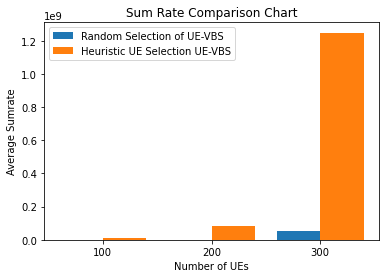

In [29]:
X = ['100','200','300']
rv = [120892,202826,50260098]
mv = [7891349,80384342,1248479067]
  
X_axis = np.arange(len(X))
  
plt.bar(X_axis - 0.2, rv, 0.4, label = 'Random Selection of UE-VBS')
plt.bar(X_axis + 0.2, mv, 0.4, label = 'Heuristic UE Selection UE-VBS')
  
plt.xticks(X_axis, X)
plt.xlabel("Number of UEs")
plt.ylabel("Average Sumrate")
plt.title("Sum Rate Comparison Chart")
plt.legend()
plt.show()

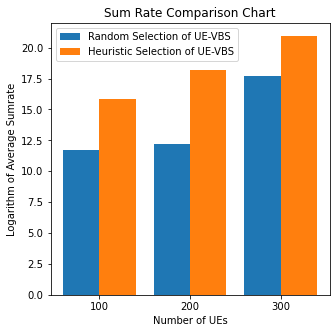

<Figure size 432x288 with 0 Axes>

In [30]:
import math

rv_ = [math.log(i) for i in rv]
mv_ = [math.log(i) for i in mv]
  
X_axis = np.arange(len(X))

plt.figure(figsize=(5, 5))
plt.bar(X_axis - 0.2, rv_, 0.4, label = 'Random Selection of UE-VBS')
plt.bar(X_axis + 0.2, mv_, 0.4, label = 'Heuristic Selection of UE-VBS')
  
plt.xticks(X_axis, X)
plt.xlabel("Number of UEs")
plt.ylabel("Logarithm of Average Sumrate")
plt.title("Sum Rate Comparison Chart")
plt.legend()
plt.show()
plt.savefig("./Fig/06_01_sumrate.png")
plt.savefig("./Eps/06_01_sumrate.eps", format="eps")